Data Visualization For the IoT

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import numpy as np

# Read the CSV file
file_path = "/content/drive/MyDrive/IoT/dataset.csv"
df = pd.read_csv(file_path)

In [3]:
print(df)

        flow_duration  Header_Length  Protocol Type  Duration         Rate  \
0            0.000000          54.00           6.00     64.00   110.797744   
1            0.006453         182.88          16.67     63.60    30.905833   
2           31.739927        7382.93           3.23     80.15     8.923224   
3            0.000000          54.00           6.00     64.00     1.697796   
4            0.000000          54.00           6.00     64.00     1.471092   
...               ...            ...            ...       ...          ...   
234740       0.000000          54.00           6.00     64.00    25.224003   
234741       0.000000           0.00           1.00     64.00     0.469918   
234742       4.274490         107.85           6.00     64.00     0.463217   
234743       0.130775       44335.00          17.00     64.00  6981.093452   
234744       0.000000          54.00           6.00     64.00     1.415373   

              Srate  Drate  fin_flag_number  syn_flag_number  r

In [4]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234745 entries, 0 to 234744
Data columns (total 47 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   flow_duration    234745 non-null  float64
 1   Header_Length    234745 non-null  float64
 2   Protocol Type    234745 non-null  float64
 3   Duration         234745 non-null  float64
 4   Rate             234745 non-null  float64
 5   Srate            234745 non-null  float64
 6   Drate            234745 non-null  float64
 7   fin_flag_number  234745 non-null  float64
 8   syn_flag_number  234745 non-null  float64
 9   rst_flag_number  234745 non-null  float64
 10  psh_flag_number  234745 non-null  float64
 11  ack_flag_number  234745 non-null  float64
 12  ece_flag_number  234745 non-null  float64
 13  cwr_flag_number  234745 non-null  float64
 14  ack_count        234745 non-null  float64
 15  syn_count        234745 non-null  float64
 16  fin_count        234745 non-null  floa

In [5]:
print(df.describe())

       flow_duration  Header_Length  Protocol Type       Duration  \
count  234745.000000   2.347450e+05  234745.000000  234745.000000   
mean        6.719492   7.791274e+04       9.078847      66.346131   
std       326.178704   4.692158e+05       8.972802      14.056953   
min         0.000000   0.000000e+00       0.000000       0.000000   
25%         0.000000   5.400000e+01       6.000000      64.000000   
50%         0.000000   5.400000e+01       6.000000      64.000000   
75%         0.105766   3.169200e+02      14.760000      64.000000   
max     59472.877903   9.670762e+06      47.000000     255.000000   

               Rate         Srate          Drate  fin_flag_number  \
count  2.347450e+05  2.347450e+05  234745.000000    234745.000000   
mean   9.149516e+03  9.149516e+03       0.000006         0.086673   
std    1.014439e+05  1.014439e+05       0.002092         0.281356   
min    0.000000e+00  0.000000e+00       0.000000         0.000000   
25%    2.115525e+00  2.115525e+00

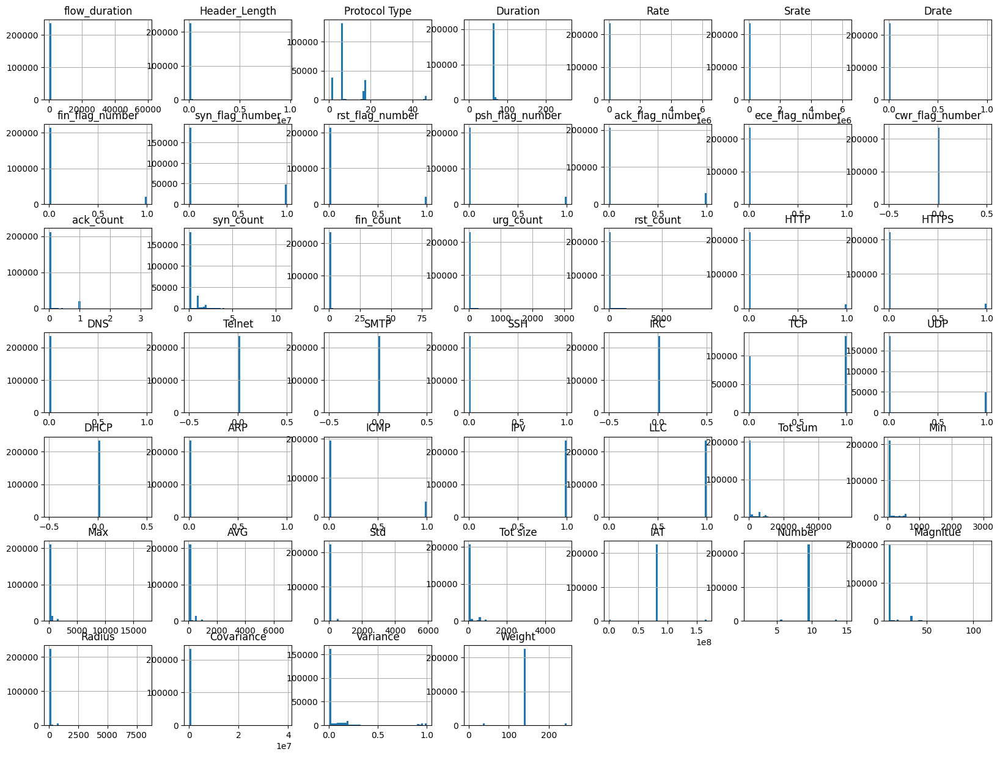

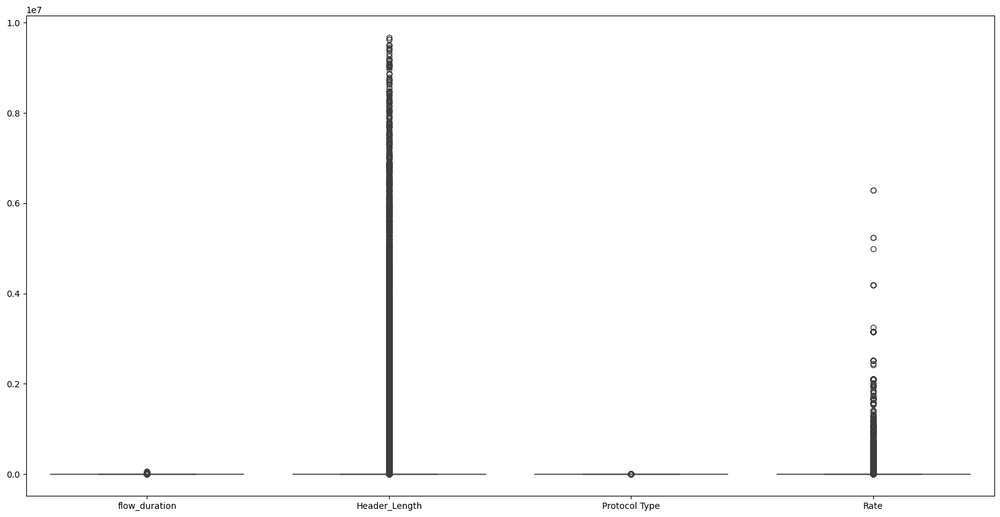

In [6]:
#Box plots to identify outliers
import matplotlib.pyplot as plt
import seaborn as sns

# Plot histograms
df.hist(bins=50, figsize=(20,15))
plt.show()

# Plot box plots for a few columns
plt.figure(figsize=(20,10))
sns.boxplot(data=df[['flow_duration', 'Header_Length', 'Protocol Type', 'Rate']])
plt.show()

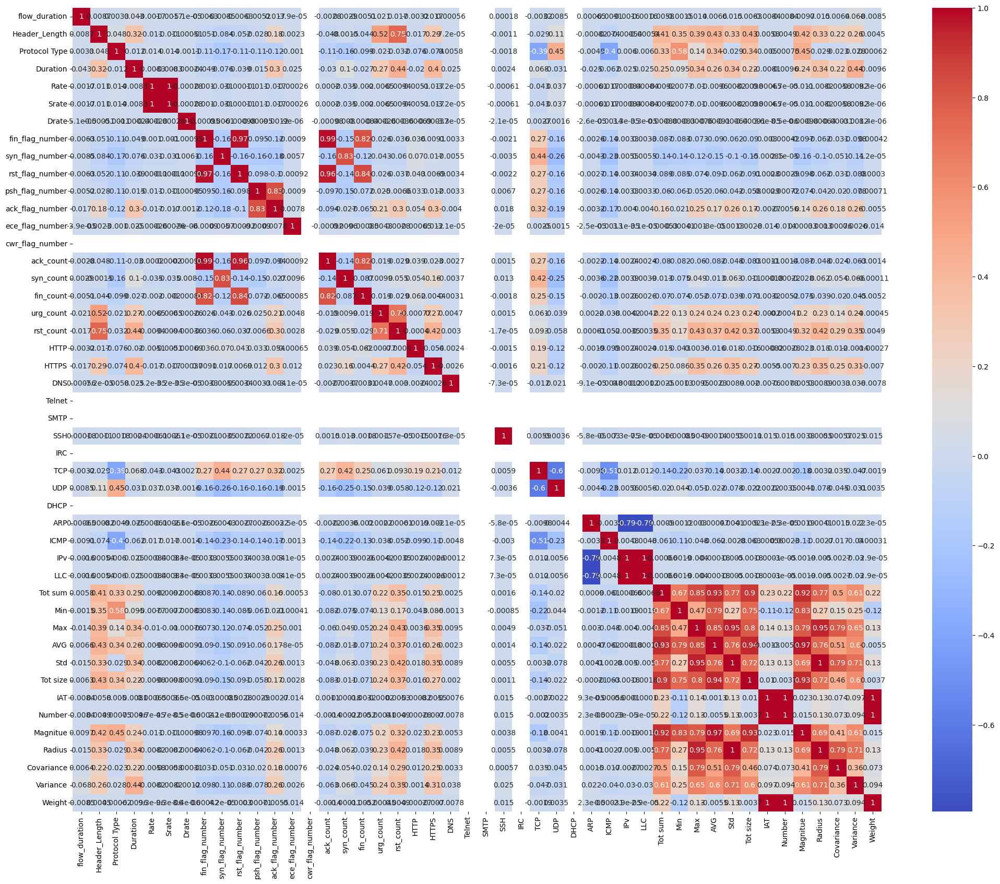

In [7]:
# Select only numeric columns
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Compute the correlation matrix
corr_matrix = df[numeric_cols].corr()

# Plot the heatmap
plt.figure(figsize=(25, 20))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

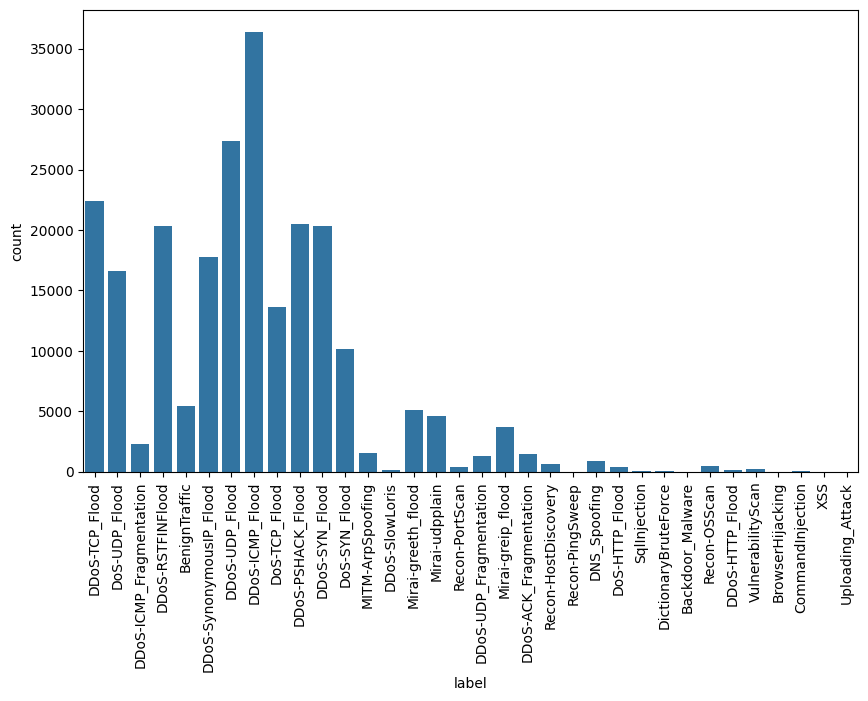

In [8]:
#Bar plot for the distribution of attack types
plt.figure(figsize=(10,6))
sns.countplot(x='label', data=df)
plt.xticks(rotation=90)
plt.show()

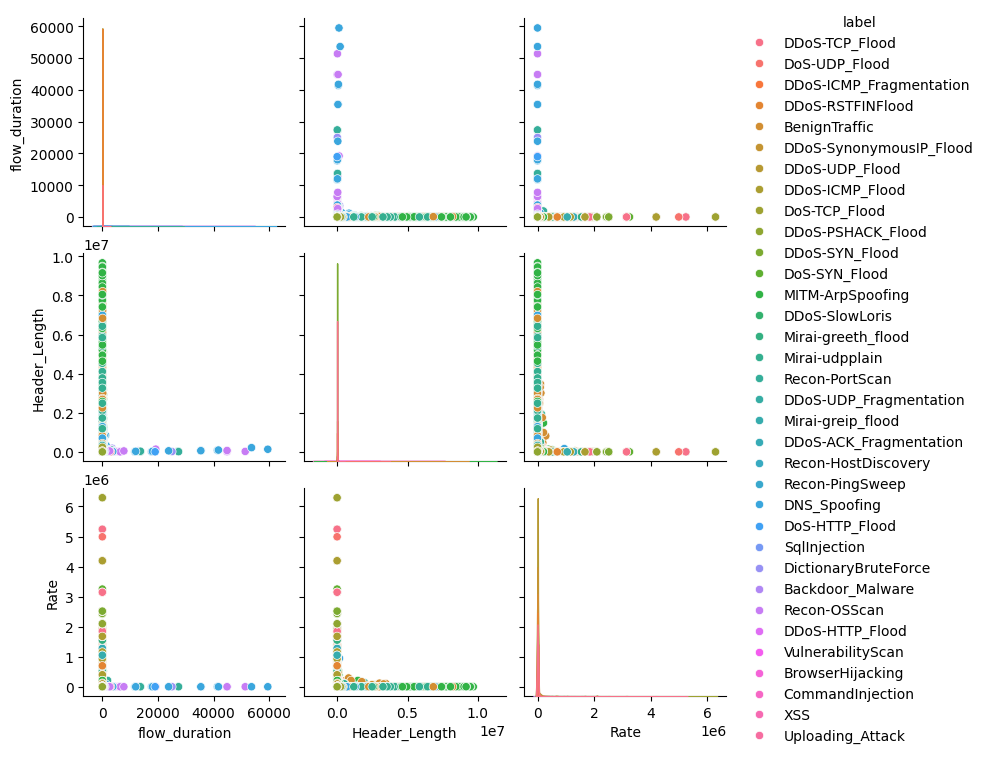

In [9]:
#pairwise relationships between features.
selected_features = ['flow_duration', 'Header_Length', 'Rate', 'label']
sns.pairplot(df[selected_features], hue='label')
plt.show()

In [11]:
#interactive visualizations.
import plotly.express as px

# Scatter plot for two features colored by label
fig = px.scatter(df, x='flow_duration', y='Rate', color='label')
fig.show()

# Interactive correlation matrix
fig = px.imshow(corr_matrix, text_auto=True, aspect='auto')
fig.show()

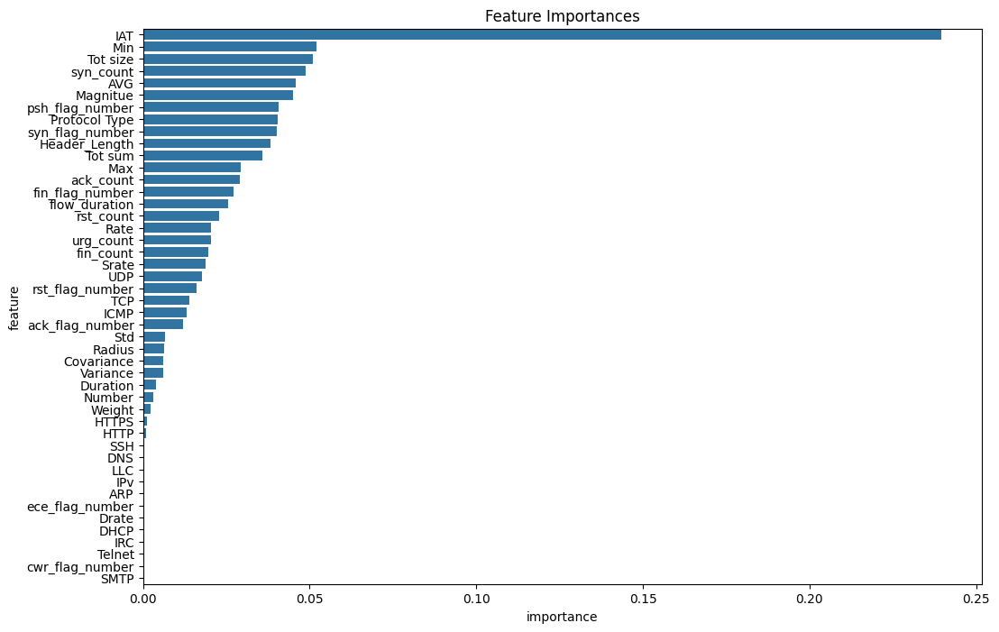

In [12]:
from sklearn.ensemble import RandomForestClassifier

# Prepare data
X = df.drop('label', axis=1)
y = df['label']
model = RandomForestClassifier()
model.fit(X, y)

# Plot feature importances
importances = model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'feature': feature_names, 'importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

plt.figure(figsize=(12,8))
sns.barplot(x='importance', y='feature', data=feature_importance_df)
plt.title('Feature Importances')
plt.show()

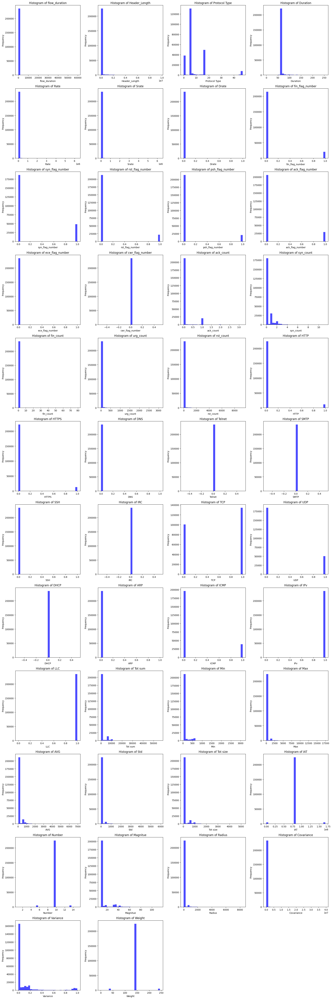

In [16]:
# Histograms of Feature Distributions
def plot_histograms(df, columns, nrows=4, ncols=4, bins=30):
    # Calculate the number of plots needed
    num_plots = len(columns)

    # Adjust grid dimensions to accommodate all plots
    nrows = int(np.ceil(num_plots / ncols))

    plt.figure(figsize=(20, 5 * nrows))  # Adjust figure height based on rows
    for i, col in enumerate(columns):
        plt.subplot(nrows, ncols, i + 1)
        plt.hist(df[col], bins=bins, alpha=0.7, color='blue')
        plt.title(f'Histogram of {col}')
        plt.xlabel(col)
        plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()

# Plot histograms for the first 16 features
plot_histograms(df, df.columns[:-1], nrows=4, ncols=4)

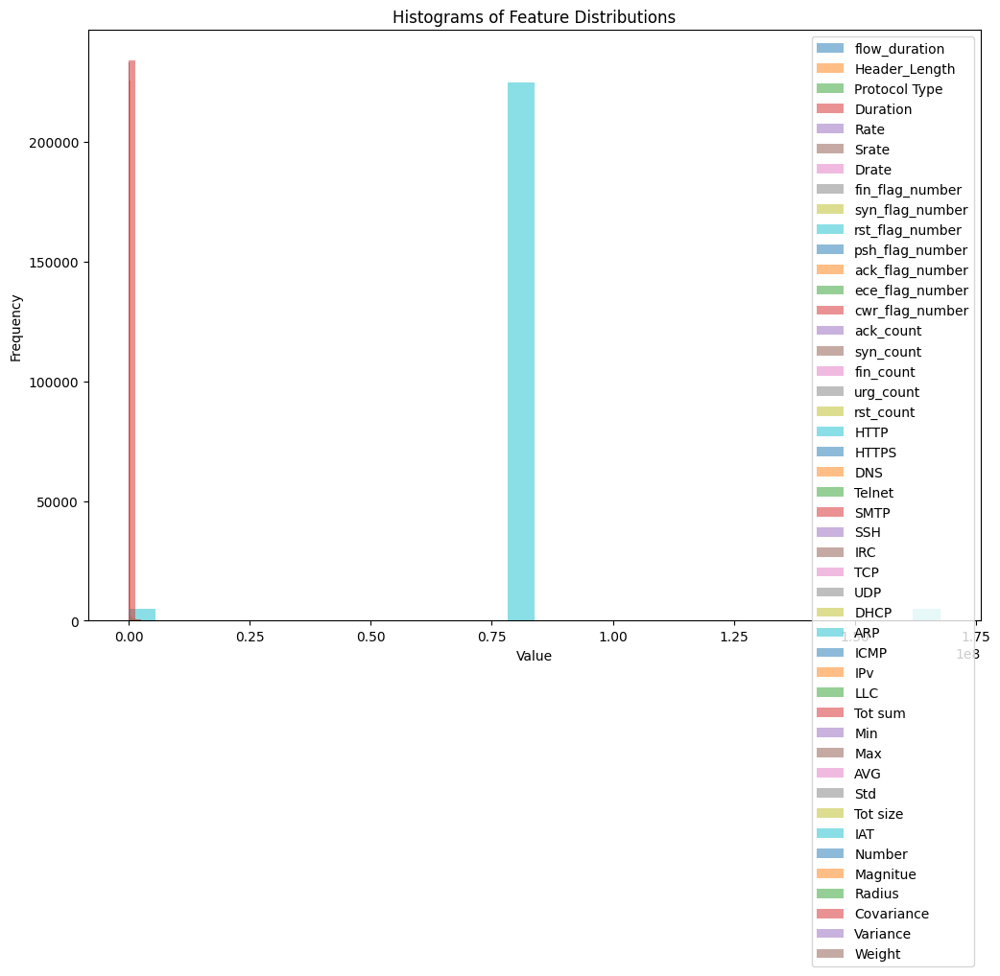

In [20]:
# Function to plot histograms of multiple features in a single bar
def plot_histograms_single_bar(df, columns, bins=30):
    plt.figure(figsize=(12, 8))

    # Plot each feature's histogram on the same axes
    for col in columns:
        plt.hist(df[col], bins=bins, alpha=0.5, label=col)

    plt.title('Histograms of Feature Distributions')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.legend(loc='upper right')
    plt.show()

# Plot histograms for all features in a single bar
plot_histograms_single_bar(df, df.columns[:-1])

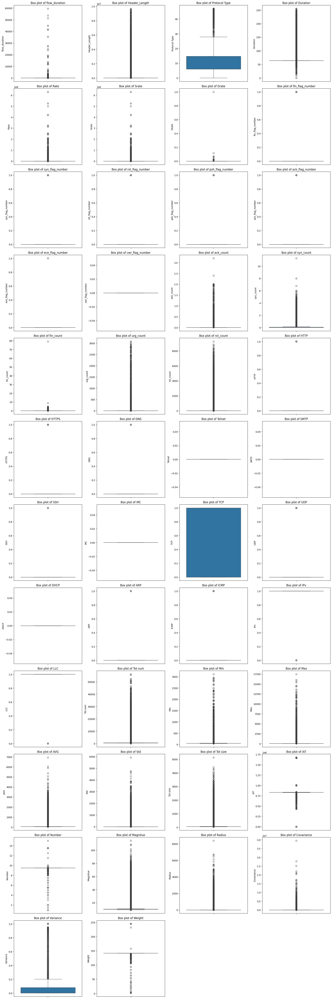

In [19]:
# Box Plots to Identify Outliers
def plot_boxplots(df, columns, nrows=4, ncols=4):
    # Calculate the number of plots needed
    num_plots = len(columns)

    # Adjust grid dimensions to accommodate all plots
    nrows = int(np.ceil(num_plots / ncols))

    plt.figure(figsize=(20, 5 * nrows))  # Adjust figure height based on rows
    for i, col in enumerate(columns):
        plt.subplot(nrows, ncols, i + 1)
        sns.boxplot(y=df[col])
        plt.title(f'Box plot of {col}')
    plt.tight_layout()
    plt.show()

# Plot box plots for the first 16 features
plot_boxplots(df, df.columns[:-1], nrows=4, ncols=4)